# League of Legends API Test

In [3]:
%pip install requests
%pip install python-dotenv
%pip install pandas
%pip install matplotlib
%pip install seaborn
%pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [1]:
import time
import os

import requests
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, roc_auc_score, accuracy_score

from dotenv import load_dotenv

load_dotenv()

API_KEY = os.getenv("API_KEY")
REGION = os.getenv("REGION")
SUB_REGION = os.getenv("SUB_REGION")
GAME_NAME = os.getenv("GAME_NAME")
TAG_LINE = os.getenv("TAG_LINE")

INFO_KEYS = [
    'gameDuration',
    'gameMode'
]

PARTICIPANT_KEYS = [
    'assists',
    'champExperience',
    'champLevel',
    'championId',
    'deaths',
    'goldEarned',
    'kills',
    'neutralMinionsKilled',
    'teamPosition',
    'totalDamageDealt',
    'totalDamageTaken',
    'totalMinionsKilled',
    'visionScore'
]

TEAM_KEYS = [
    'win'
]

OBJECTIVES_KEYS = [
    'baron',
    'champion',
    'dragon',
    'horde',
    'inhibitor',
    'riftHerald',
    'tower'
]

ROLES = {
    "BOTTOM": 1,
    "UTILITY": 2,
    "MIDDLE": 3,
    "JUNGLE": 4,
    "TOP": 5
}

## API Call

In [2]:
def call_api(region: str, url: str, params:dict = {}):
    formatted_url = f"https://{region}.api.riotgames.com{url}?api_key={API_KEY}"
    for key, val in params.items():
        formatted_url += f"&{key}={val}"

    res = requests.get(url=formatted_url)

    if res.status_code == 200:
        return res.json()
    
    raise Exception(f"API error: {res.text}")

## Get Player UUID

In [6]:
def get_player_uuid(region, game_name, tag_line):
    url = f"/riot/account/v1/accounts/by-riot-id/{game_name}/{tag_line}"
    return call_api(region, url)

In [7]:
PUUID = get_player_uuid(REGION, GAME_NAME, TAG_LINE)['puuid']
PUUID

'jsLU87KgS-E5pPbRE63VLxyt5TsnL6_sblkVCP9UwI_gDOL5SWsni2pvMx8OeJfWdhi5fP5tr6aFNg'

## Get Match

In [8]:
def get_last_matches(puuid: str, n_matches: int) -> list[str]:
    url = f"/lol/match/v5/matches/by-puuid/{puuid}/ids"
    params = {'count': n_matches}
    return call_api(REGION, url, params)

In [9]:
last_matches_id = get_last_matches(PUUID, 100)
last_matches_id

['EUW1_7200938077',
 'EUW1_7200890665',
 'EUW1_7200851340',
 'EUW1_7198371692',
 'EUW1_7198315281',
 'EUW1_7197343081',
 'EUW1_7197324546',
 'EUW1_7197301962',
 'EUW1_7197284910',
 'EUW1_7197265809',
 'EUW1_7197255833',
 'EUW1_7197236151',
 'EUW1_7197191259',
 'EUW1_7197146352',
 'EUW1_7196213144',
 'EUW1_7196185579',
 'EUW1_7196172921',
 'EUW1_7196128249',
 'EUW1_7196099480',
 'EUW1_7196061467',
 'EUW1_7196016600',
 'EUW1_7196003883',
 'EUW1_7194524810',
 'EUW1_7194494935',
 'EUW1_7194460614',
 'EUW1_7194427954',
 'EUW1_7194380038',
 'EUW1_7194358570',
 'EUW1_7194343748',
 'EUW1_7190991073',
 'EUW1_7190963056',
 'EUW1_7190930824',
 'EUW1_7190920384',
 'EUW1_7190906268',
 'EUW1_7190887198',
 'EUW1_7190542060',
 'EUW1_7190488219',
 'EUW1_7190421775',
 'EUW1_7189118585',
 'EUW1_7187989099',
 'EUW1_7187936043',
 'EUW1_7187886609',
 'EUW1_7187463674',
 'EUW1_7187437689',
 'EUW1_7187393241',
 'EUW1_7187359086',
 'EUW1_7187299638',
 'EUW1_7172824953',
 'EUW1_7172794687',
 'EUW1_7171419559',


## Retrieve Match Info

In [10]:
def get_matches_info(matches_ids: list[str]) -> list[dict]:
    matches_info = []
    
    for match_id in matches_ids:
        url = f"/lol/match/v5/matches/{match_id}"
        matches_info.append(call_api(REGION, url))
        time.sleep(1)

    return matches_info

In [11]:
matches_info = get_matches_info(last_matches_id)
matches_info

[{'metadata': {'dataVersion': '2',
   'matchId': 'EUW1_7200938077',
   'participants': ['zFjbkgjMKIssvZUUAQQSy-sooxb6RqSAP5PVXQHLMf8HtZAJBjQRV__ipj_k8Y6zW7R0U3EClapEaQ',
    'WtzOlsNMiQOBCYS4E3wEDllwKhZpDWcP6iR_G1hAk95xrYWaVZFNz7LqVCf5u8ES88HASPQGFbv3bw',
    'IMsqCmG0-6VLGoq3FmZ6NcW-94t80mwF3FrIBFBVAhVnD8TMRJAqYdm2VKcSqLxu7Nl_shJyHPPy3w',
    'jsLU87KgS-E5pPbRE63VLxyt5TsnL6_sblkVCP9UwI_gDOL5SWsni2pvMx8OeJfWdhi5fP5tr6aFNg',
    'Zr2pvsfvXMnKP0EMIBe7DPCj-zoe7MUmrTBjXyUy1Yk2WAh3kM6PX_vemkgINVA6yTCoq9S64kKJmQ',
    'T4tQ6IWA4L8HmIJFl8TEN4JjnNaZQ5czUhi_IXxVZU2ZJHjPY2GqkUDQhWb9XMEh2nw9QfXfEi2UfQ',
    'KWIZlt99cJCmMwy0da1lHByTsPOVGAA76EFZgIQsiYQ4oUe76RxSSSBxpIjGlP7FTepNwCLlIDbx7w',
    'IhYZvnuSh0kUcXJgOfbvbk6c9D2JNBSbM02G26ifS7O82e8tVoW3lvchSjp3RmtUQ28J_qWsEhsMSw',
    'epnDksF3A5icEhFFLNpYd2kBipPNDpD6jQhXSUUa3QGEau7wb3Rk4ITJNcrbbmfO6a0TXr-hkOvQfg',
    '7Eg5nHnwuG_q_YH0S9DAXKPg-JwzMvgD-TrnWOeQ31emqS7UdZyQu7wWMPTQeRSky--W7ZbcdnSb6A']},
  'info': {'endOfGameResult': 'GameComplete',
   'game

## Extract Useful Info

In [12]:
def extract_info(puuid: str, matches_info: list[dict]) -> pd.DataFrame:
    filtered_info = []

    for match_info in matches_info:
        player_info = []

        for key in INFO_KEYS:
            player_info.append(match_info['info'][key])

        for p in match_info['info']['participants']:
            if p['puuid'] == puuid:
                team_id = p['teamId']
                for key in PARTICIPANT_KEYS:
                    player_info.append(p[key])
        
        for t in match_info['info']['teams']:
            if t['teamId'] == team_id:
                for key in TEAM_KEYS:
                    player_info.append(t[key])
                for key in OBJECTIVES_KEYS:
                    player_info.append(t['objectives'][key]['kills'])

        filtered_info.append(player_info)

    df_matches_info = pd.DataFrame(filtered_info, columns=INFO_KEYS+PARTICIPANT_KEYS+TEAM_KEYS+OBJECTIVES_KEYS)

    return df_matches_info

In [13]:
df_info = extract_info(PUUID, matches_info)

In [14]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

df_info.head(10)

,gameDuration,gameMode,assists,champExperience,champLevel,championId,deaths,goldEarned,kills,neutralMinionsKilled,teamPosition,totalDamageDealt,totalDamageTaken,totalMinionsKilled,visionScore,win,baron,champion,dragon,horde,inhibitor,riftHerald,tower
0,2254,CLASSIC,3,14475,15,67,8,15210,5,0,BOTTOM,176267,27472,269,29,False,0,22,0,0,0,0,3
1,3000,CLASSIC,19,26420,18,3,10,19127,9,4,MIDDLE,239883,54500,255,41,True,3,58,5,3,2,0,8
2,2103,CLASSIC,14,17124,17,3,5,15311,11,4,MIDDLE,194243,27013,190,23,True,1,40,5,0,3,0,11
3,1074,ARAM,18,17421,17,150,11,12063,8,0,,57716,33888,47,0,False,0,47,0,0,0,0,0
4,1399,CLASSIC,4,9405,12,3,8,6313,0,0,MIDDLE,87290,17329,123,11,False,0,15,1,1,0,0,1
5,2100,ARAM,27,48008,18,245,22,23790,20,0,,258855,75293,116,0,True,0,84,0,0,2,0,4
6,1934,ARAM,27,39954,18,21,21,25088,32,0,,233448,51217,159,0,False,0,93,0,0,2,0,4
7,1091,ARAM,9,13980,15,497,9,9680,3,0,,17132,24133,12,0,False,0,28,0,0,0,0,0
8,945,ARAM,27,17385,17,67,8,12385,15,0,,57068,18471,31,0,True,0,72,0,0,2,0,4
9,917,ARAM,21,15771,16,7,13,11347,15,0,,51569,25860,26,0,False,0,50,0,0,0,0,0


## Data Pre-treatement

In [15]:
data = df_info.copy()

In [16]:
## filter game mode
data = data[data['gameMode'] == 'CLASSIC']
data = data.drop(columns=["gameMode"])
len(data)

84

In [17]:
data.dtypes

gameDuration             int64
assists                  int64
champExperience          int64
champLevel               int64
championId               int64
deaths                   int64
goldEarned               int64
kills                    int64
neutralMinionsKilled     int64
teamPosition            object
totalDamageDealt         int64
totalDamageTaken         int64
totalMinionsKilled       int64
visionScore              int64
win                       bool
baron                    int64
champion                 int64
dragon                   int64
horde                    int64
inhibitor                int64
riftHerald               int64
tower                    int64
dtype: object

In [18]:
## replace teamPosition to numerical
data['teamPosition'] = data['teamPosition'].replace(ROLES)

C:\Users\david\AppData\Local\Temp\ipykernel_14948\573829962.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data['teamPosition'] = data['teamPosition'].replace(ROLES)


In [19]:
## set column 'win' to numerical
data['win'] = data['win'].astype(int)

In [20]:
## drop empty values
data = data.dropna()

## Visualisation

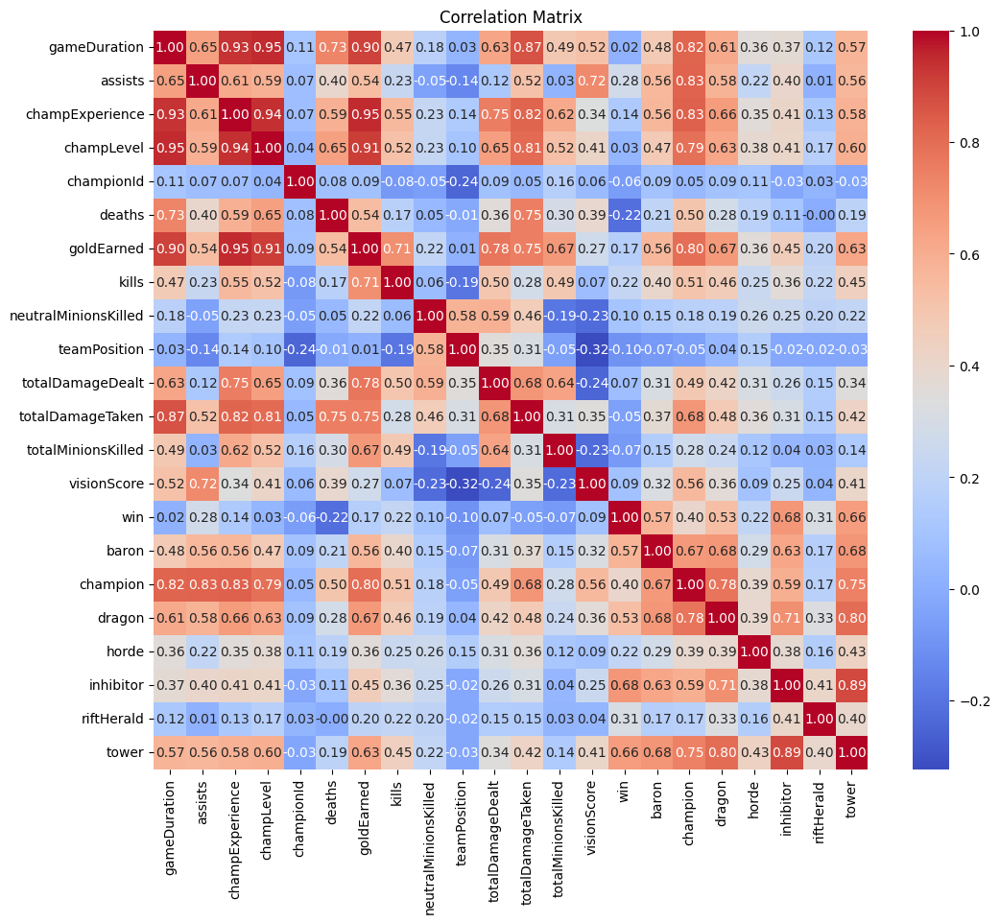

In [21]:
## 1. Correlation matrix
plt.figure(figsize=(12, 10))
corr_matrix = data.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Matrix")
plt.show()

C:\Users\david\AppData\Local\Temp\ipykernel_14948\3504546267.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=role_counts.index, y=role_counts.values, palette="viridis")


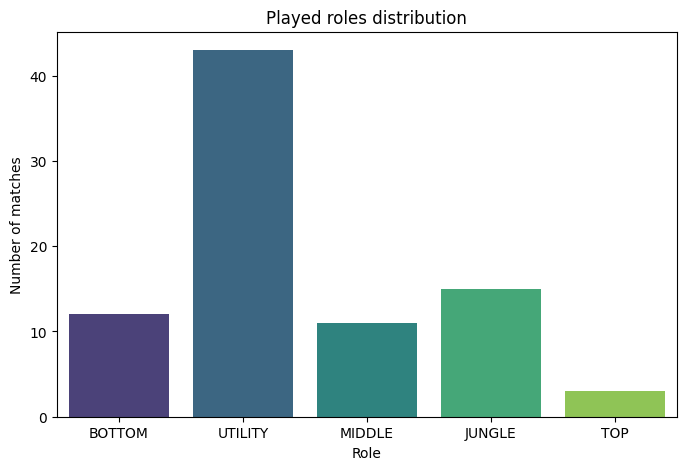

In [22]:
## 2. Played roles distribution
role_counts = data['teamPosition'].value_counts().sort_index()
plt.figure(figsize=(8, 5))
sns.barplot(x=role_counts.index, y=role_counts.values, palette="viridis")
plt.title("Played roles distribution")
plt.xlabel("Role")
plt.ylabel("Number of matches")
plt.xticks(ticks=range(5), labels=ROLES.keys())
plt.show()

C:\Users\david\AppData\Local\Temp\ipykernel_14948\430462557.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='win', y='goldEarned', data=data, palette="Set3")


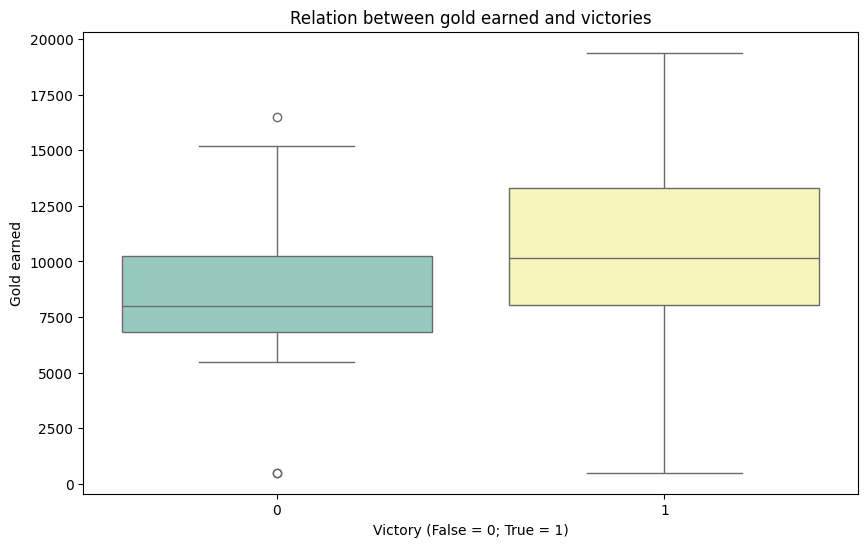

In [23]:
## 3. Relation between gold earned and victories
plt.figure(figsize=(10, 6))
sns.boxplot(x='win', y='goldEarned', data=data, palette="Set3")
plt.title("Relation between gold earned and victories")
plt.xlabel("Victory (False = 0; True = 1)")
plt.ylabel("Gold earned")
plt.show()

## Train Model

In [32]:
X = data.drop(columns=['win'])
Y = data['win']

In [33]:
## Normalize X
# scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X)

In [64]:
## Decompose training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.15)

In [65]:
## Train model
model = RandomForestClassifier(n_estimators=100)
model.fit(X_train, y_train)

RandomForestClassifier()

In [9]:
import joblib

joblib.dump(model, f'../data/random_forest_{PUUID}.pkl')

NameError: name 'PUUID' is not defined

## Predict

In [67]:
## Make a prediction
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:, 1] # positive class

In [68]:
df_test = X_test
df_test['win'] = y_test
df_test['win_pred'] = y_pred
df_test['win_pred_proba'] = y_pred_proba

df_test

,gameDuration,assists,champExperience,champLevel,championId,deaths,goldEarned,kills,neutralMinionsKilled,teamPosition,totalDamageDealt,totalDamageTaken,totalMinionsKilled,visionScore,baron,champion,dragon,horde,inhibitor,riftHerald,tower,win,win_pred,win_pred_proba
70,1699,11,8759,12,54,6,9259,5,0,2,47502,19405,44,61,0,20,1,0,0,0,3,0,0,0.10
1,3000,19,26420,18,3,10,19127,9,4,3,239883,54500,255,41,3,58,5,3,2,0,8,1,1,0.82
57,1731,12,11152,13,54,4,9451,2,10,2,60412,15355,42,57,1,37,4,1,3,0,11,1,1,0.96
15,1277,1,7413,11,45,9,5561,2,0,2,43548,15099,45,36,0,9,0,0,0,0,0,0,0,0.27
41,1462,8,10022,13,3,5,9255,6,0,3,69741,17620,96,12,0,22,2,0,0,0,2,0,0,0.09
84,2144,5,16148,16,236,4,15590,4,12,1,220148,26990,270,23,1,27,4,0,3,1,11,1,1,0.90
72,1531,5,7559,11,111,6,6159,2,0,2,30017,22877,35,44,0,20,1,3,0,0,1,0,0,0.06
30,1540,14,10525,13,3,5,9056,4,2,2,61577,19173,44,45,1,29,1,6,1,0,8,1,1,0.79
16,105,0,0,1,45,0,500,0,0,2,231,0,0,0,0,0,0,0,0,0,0,1,1,0.82
65,3119,22,25777,18,222,9,19386,7,8,1,356797,43483,299,42,1,59,4,3,1,0,8,1,1,0.70


## Evaluate

In [69]:
print("Accurary:", accuracy_score(y_test, y_pred))
print("ROC-AUC", roc_auc_score(y_test, y_pred_proba))
print("\nClassification report\n", classification_report(y_test, y_pred))

Accurary: 1.0
ROC-AUC 1.0

Classification report
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         5
           1       1.00      1.00      1.00         8

    accuracy                           1.00        13
   macro avg       1.00      1.00      1.00        13
weighted avg       1.00      1.00      1.00        13



## Get Champs info

In [3]:
url = "https://ddragon.leagueoflegends.com/cdn/14.23.1/data/en_US/champion.json"
res = requests.get(url=url)

In [5]:
data = res.json()

In [6]:
data

{'type': 'champion',
 'format': 'standAloneComplex',
 'version': '14.23.1',
 'data': {'Aatrox': {'version': '14.23.1',
   'id': 'Aatrox',
   'key': '266',
   'name': 'Aatrox',
   'title': 'the Darkin Blade',
   'blurb': 'Once honored defenders of Shurima against the Void, Aatrox and his brethren would eventually become an even greater threat to Runeterra, and were defeated only by cunning mortal sorcery. But after centuries of imprisonment, Aatrox was the first to find...',
   'info': {'attack': 8, 'defense': 4, 'magic': 3, 'difficulty': 4},
   'image': {'full': 'Aatrox.png',
    'sprite': 'champion0.png',
    'group': 'champion',
    'x': 0,
    'y': 0,
    'w': 48,
    'h': 48},
   'tags': ['Fighter'],
   'partype': 'Blood Well',
   'stats': {'hp': 650,
    'hpperlevel': 114,
    'mp': 0,
    'mpperlevel': 0,
    'movespeed': 345,
    'armor': 38,
    'armorperlevel': 4.8,
    'spellblock': 32,
    'spellblockperlevel': 2.05,
    'attackrange': 175,
    'hpregen': 3,
    'hpregenperl

In [8]:
champ_map = {int(champ["key"]): champ["name"] for champ in data["data"].values()}
champ_map

{266: 'Aatrox',
 103: 'Ahri',
 84: 'Akali',
 166: 'Akshan',
 12: 'Alistar',
 799: 'Ambessa',
 32: 'Amumu',
 34: 'Anivia',
 1: 'Annie',
 523: 'Aphelios',
 22: 'Ashe',
 136: 'Aurelion Sol',
 893: 'Aurora',
 268: 'Azir',
 432: 'Bard',
 200: "Bel'Veth",
 53: 'Blitzcrank',
 63: 'Brand',
 201: 'Braum',
 233: 'Briar',
 51: 'Caitlyn',
 164: 'Camille',
 69: 'Cassiopeia',
 31: "Cho'Gath",
 42: 'Corki',
 122: 'Darius',
 131: 'Diana',
 119: 'Draven',
 36: 'Dr. Mundo',
 245: 'Ekko',
 60: 'Elise',
 28: 'Evelynn',
 81: 'Ezreal',
 9: 'Fiddlesticks',
 114: 'Fiora',
 105: 'Fizz',
 3: 'Galio',
 41: 'Gangplank',
 86: 'Garen',
 150: 'Gnar',
 79: 'Gragas',
 104: 'Graves',
 887: 'Gwen',
 120: 'Hecarim',
 74: 'Heimerdinger',
 910: 'Hwei',
 420: 'Illaoi',
 39: 'Irelia',
 427: 'Ivern',
 40: 'Janna',
 59: 'Jarvan IV',
 24: 'Jax',
 126: 'Jayce',
 202: 'Jhin',
 222: 'Jinx',
 145: "Kai'Sa",
 429: 'Kalista',
 43: 'Karma',
 30: 'Karthus',
 38: 'Kassadin',
 55: 'Katarina',
 10: 'Kayle',
 141: 'Kayn',
 85: 'Kennen',
 1

In [10]:
import joblib

model = joblib.load("../data/random_forest_jsLU87KgS-E5pPbRE63VLxyt5TsnL6_sblkVCP9UwI_gDOL5SWsni2pvMx8OeJfWdhi5fP5tr6aFNg.pkl")

In [11]:
type(model)

sklearn.ensemble._forest.RandomForestClassifier